In [1]:
# Gerekli kütüphanelerin yüklenmesi
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, roc_auc_score

print("Gerekli kütüphaneler başarıyla yüklendi.")

Gerekli kütüphaneler başarıyla yüklendi.


Veri seti başarıyla yüklendi. Orijinal veri sayısı: 918
--- BOŞ DEĞER KONTROLÜ ---
Veri setinde hiç boş değer yok.

--- SINIF DENGESİ ---
0 (Sağlıklı): 410 kişi (%44.66)
1 (Hasta)   : 508 kişi (%55.34)


C:\Users\user\AppData\Local\Temp\ipykernel_19672\1139689852.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='HeartDisease', data=df, palette='viridis')


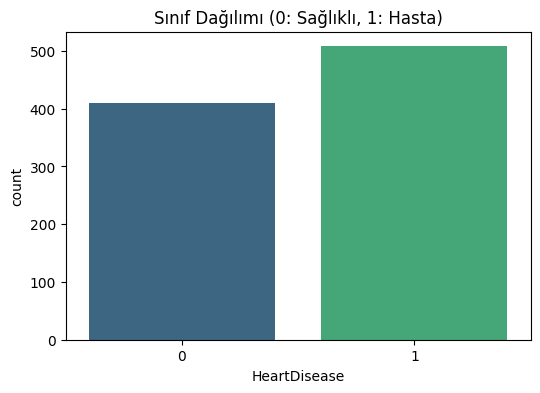

   Age  RestingBP  Cholesterol  FastingBS  MaxHR  Oldpeak  HeartDisease  \
0   40        140          289          0    172      0.0             0   
1   49        160          180          0    156      1.0             1   
2   37        130          283          0     98      0.0             0   
3   48        138          214          0    108      1.5             1   
4   54        150          195          0    122      0.0             0   

   Sex_M  ChestPainType_ATA  ChestPainType_NAP  ChestPainType_TA  \
0   True               True              False             False   
1  False              False               True             False   
2   True               True              False             False   
3  False              False              False             False   
4   True              False               True             False   

   RestingECG_Normal  RestingECG_ST  ExerciseAngina_Y  ST_Slope_Flat  \
0               True          False             False          False

In [2]:
# Veri setinin yüklenmesi
try:
    df = pd.read_csv('dataset.csv')
    print(f"Veri seti başarıyla yüklendi. Orijinal veri sayısı: {len(df)}")
except Exception as e:
    print("Hata: 'kalp_yetmezliği.csv' dosyası bulunamadı. Lütfen dosyanın kodla aynı klasörde olduğundan emin ol.")

# 1. Boş (Eksik) Değer Kontrolü
print("--- BOŞ DEĞER KONTROLÜ ---")
boş_değerler = df.isnull().sum()
if boş_değerler.sum() == 0:
    print("Veri setinde hiç boş değer yok.\n")
else:
    print("Bazı sütunlarda boş değerler var:")
    print(boş_değerler[boş_değerler > 0])
    print("\n")

# 2. Sınıf Dengesi Kontrolü
print("--- SINIF DENGESİ ---")
sayılar = df['HeartDisease'].value_counts()
oranlar = df['HeartDisease'].value_counts(normalize=True) * 100

print(f"0 (Sağlıklı): {sayılar[0]} kişi (%{oranlar[0]:.2f})")
print(f"1 (Hasta)   : {sayılar[1]} kişi (%{oranlar[1]:.2f})")

# 3. Görselleştirme
plt.figure(figsize=(6, 4))
sns.countplot(x='HeartDisease', data=df, palette='viridis')
plt.title('Sınıf Dağılımı (0: Sağlıklı, 1: Hasta)')
plt.show()

# Encoding (Metinleri sayıya çevirme)
df_final = pd.get_dummies(df, drop_first=True)
print(df_final.head())
x = df_final.drop('HeartDisease', axis=1)
y = df_final['HeartDisease']

In [7]:
# Modellerin tanımlanması
models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42)
}

scorers = {
    "Accuracy": 'accuracy',
    "Precision": 'precision',
    "Recall": 'recall',
    "F1-Score": 'f1',
    "Kappa": make_scorer(cohen_kappa_score),
    "ROC-AUC": 'roc_auc'
}

In [8]:
# 10-Fold Cross Validation
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
results = []

print("\n10-Fold Cross Validation işlemi başladı...")

for name, model in models.items():
    cv_output = cross_validate(model, x, y, cv=cv, scoring=scorers)
    res = {
        "Model": name,
        "Accuracy": np.mean(cv_output['test_Accuracy']),
        "Precision": np.mean(cv_output['test_Precision']),
        "Recall": np.mean(cv_output['test_Recall']),
        "F1-Score": np.mean(cv_output['test_F1-Score']),
        "Kappa": np.mean(cv_output['test_Kappa']),
        "ROC-AUC": np.mean(cv_output['test_ROC-AUC'])
    }
    results.append(res)
    print(f"{name} tamamlandı.")


10-Fold Cross Validation işlemi başladı...
Random Forest tamamlandı.
XGBoost tamamlandı.
AdaBoost tamamlandı.


In [ ]:
# 6. Sonuçlar
df_cv_results = pd.DataFrame(results)

print("\n" + "="*70)
print("                 10-FOLD CROSS VALIDATION SONUÇLAR")
print("="*70)

print(df_cv_results.to_string(index=False, float_format=lambda x: "{:.4f}".format(x) if isinstance(x, float) else x))



                 10-FOLD CROSS VALIDATION SONUÇLAR
        Model  Accuracy  Precision  Recall  F1-Score  Kappa  ROC-AUC
Random Forest    0.8671     0.8658  0.9036    0.8830 0.7293   0.9286
      XGBoost    0.8660     0.8676  0.8978    0.8812 0.7276   0.9304
     AdaBoost    0.8649     0.8554  0.9116    0.8817 0.7246   0.9228


In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Random Forest için aranacak ayarlar 
rf_param_grid = {
    'n_estimators': [100, 300, 500, 800],
    'max_depth': [10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Arama mekanizmasını kuruyoruz
rf_random = RandomizedSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    param_distributions=rf_param_grid,
    n_iter=20,     
    cv=10,         
    verbose=2, 
    random_state=42, 
    n_jobs=-1      
)

print("Random Forest için en iyi parametreler aranıyor...")
rf_random.fit(x, y)

print(f"En İyi RF Ayarları: {rf_random.best_params_}")

Random Forest için en iyi parametreler aranıyor...
Fitting 10 folds for each of 20 candidates, totalling 200 fits
En İyi RF Ayarları: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}


In [12]:
xgb_param_grid = {
    'n_estimators': [100, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 6, 8],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9]
}

xgb_random = RandomizedSearchCV(
    estimator=XGBClassifier(eval_metric="mlogloss", random_state=42),
    param_distributions=xgb_param_grid,
    n_iter=15, 
    cv=10, 
    verbose=1, 
    n_jobs=-1
)
xgb_random.fit(x, y)
print(f"En İyi XGBoost Ayarları: {xgb_random.best_params_}")

Fitting 10 folds for each of 15 candidates, totalling 150 fits
En İyi XGBoost Ayarları: {'subsample': 0.9, 'n_estimators': 300, 'max_depth': 4, 'learning_rate': 0.05, 'colsample_bytree': 0.9}


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV

# AdaBoost için aranacak ayarlar
ada_param_grid = {
    'n_estimators': [50, 100, 300, 500, 800],
    'learning_rate': [0.01, 0.05, 0.1, 0.5, 1.0],
    'estimator__max_depth': [1, 2, 3]  
}

# Arama mekanizması
ada_random = RandomizedSearchCV(
    estimator=AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42),
    param_distributions=ada_param_grid,
    n_iter=15, 
    cv=5, 
    verbose=1, 
    n_jobs=-1,
    random_state=42
)

print("AdaBoost için en iyi parametreler aranıyor...")
ada_random.fit(x, y)

print(f"En İyi AdaBoost Ayarları: {ada_random.best_params_}")

AdaBoost için en iyi parametreler aranıyor...
Fitting 5 folds for each of 15 candidates, totalling 75 fits
En İyi AdaBoost Ayarları: {'n_estimators': 500, 'learning_rate': 0.01, 'estimator__max_depth': 2}


In [ ]:
# Modellerin tanımlanması
models = {
    "Random Forest": RandomForestClassifier(random_state=42, n_estimators= 100, min_samples_split= 5, min_samples_leaf= 1, max_features= 'log2', max_depth= None),
    "XGBoost": XGBClassifier(random_state=42, subsample= 0.9, n_estimators= 300, max_depth= 4, learning_rate= 0.05, colsample_bytree= 0.9),
    "AdaBoost": AdaBoostClassifier(random_state=42, n_estimators= 500, learning_rate= 0.01, estimator= DecisionTreeClassifier(max_depth=2))
}

scorers = {
    "Accuracy": 'accuracy',
    "Precision": 'precision',
    "Recall": 'recall',
    "F1-Score": 'f1',
    "Kappa": make_scorer(cohen_kappa_score),
    "ROC-AUC": 'roc_auc'
}

# 10-Fold Cross Validation
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
results = []

print("\n10-Fold Cross Validation işlemi başladı...")

for name, model in models.items():
    cv_output = cross_validate(model, x, y, cv=cv, scoring=scorers)
    res = {
        "Model": name,
        "Accuracy": np.mean(cv_output['test_Accuracy']),
        "Precision": np.mean(cv_output['test_Precision']),
        "Recall": np.mean(cv_output['test_Recall']),
        "F1-Score": np.mean(cv_output['test_F1-Score']),
        "Kappa": np.mean(cv_output['test_Kappa']),
        "ROC-AUC": np.mean(cv_output['test_ROC-AUC'])
    }
    results.append(res)
    print(f"{name} tamamlandı.")

# 6. Sonuçlar
df_cv_results = pd.DataFrame(results)

print("\n" + "="*70)
print("                 10-FOLD CROSS VALIDATION SONUÇLAR")
print("="*70)

print(df_cv_results.to_string(index=False, float_format=lambda x: "{:.4f}".format(x) if isinstance(x, float) else x))



10-Fold Cross Validation işlemi başladı...
Random Forest tamamlandı.
XGBoost tamamlandı.
AdaBoost tamamlandı.

                 10-FOLD CROSS VALIDATION SONUÇLAR
        Model  Accuracy  Precision  Recall  F1-Score  Kappa  ROC-AUC
Random Forest    0.8671     0.8658  0.9036    0.8830 0.7293   0.9286
      XGBoost    0.8660     0.8676  0.8978    0.8812 0.7276   0.9304
     AdaBoost    0.8649     0.8554  0.9116    0.8817 0.7246   0.9228


<Figure size 700x600 with 0 Axes>

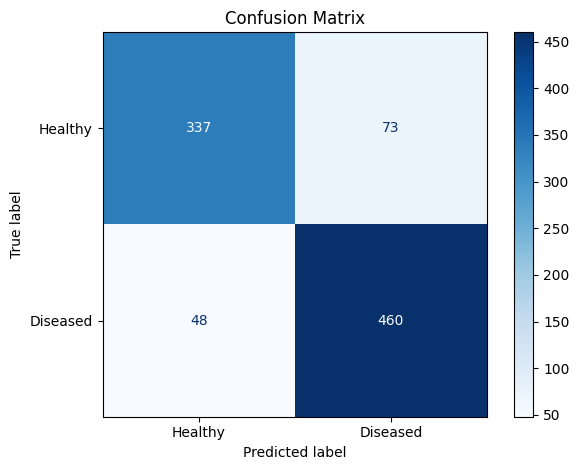

In [ ]:
# Confusion Matrix
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

model = RandomForestClassifier(random_state=42)

y_pred = cross_val_predict(
    model,
    x,
    y,
    cv=cv,
    n_jobs=-1
)

cm = confusion_matrix(y, y_pred)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=['Healthy', 'Diseased']
)

plt.figure(figsize=(7, 6))
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()


C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils

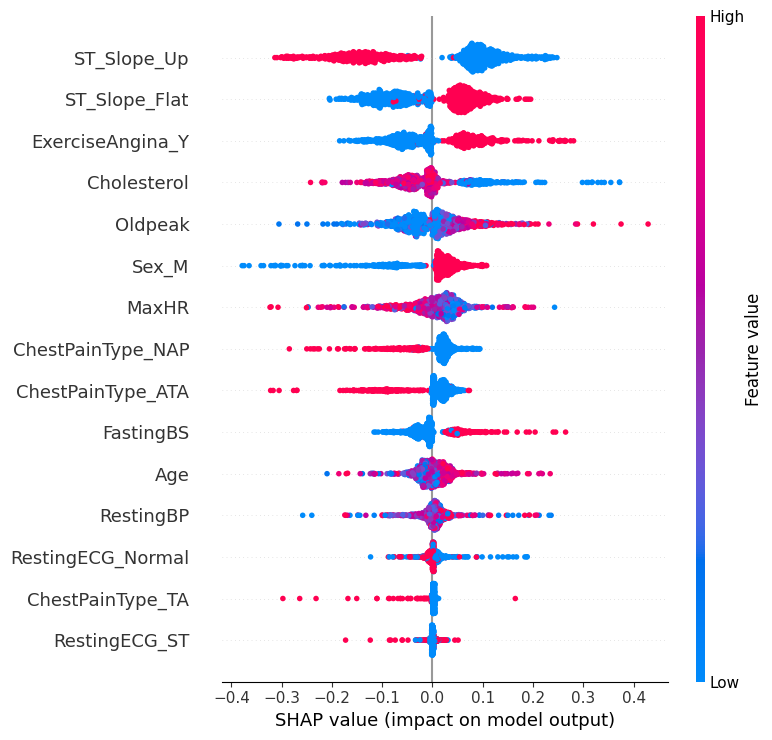

In [20]:
# SHAP GRAFİĞİ

import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from imblearn.pipeline import make_pipeline as make_imb_pipeline

model = RandomForestClassifier(random_state=42)

pipeline = make_imb_pipeline(
    StandardScaler(),
    model
)

pipeline.fit(x, y)

scaler = pipeline.named_steps['standardscaler']
x_scaled = scaler.transform(x)
x_scaled_df = pd.DataFrame(x_scaled, columns=x.columns)

model = pipeline.named_steps['randomforestclassifier']

explainer = shap.Explainer(model.predict, x_scaled_df)

shap_values = explainer(x_scaled_df)

shap.summary_plot(
    shap_values.values,
    x_scaled_df,
    show=True
)

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils

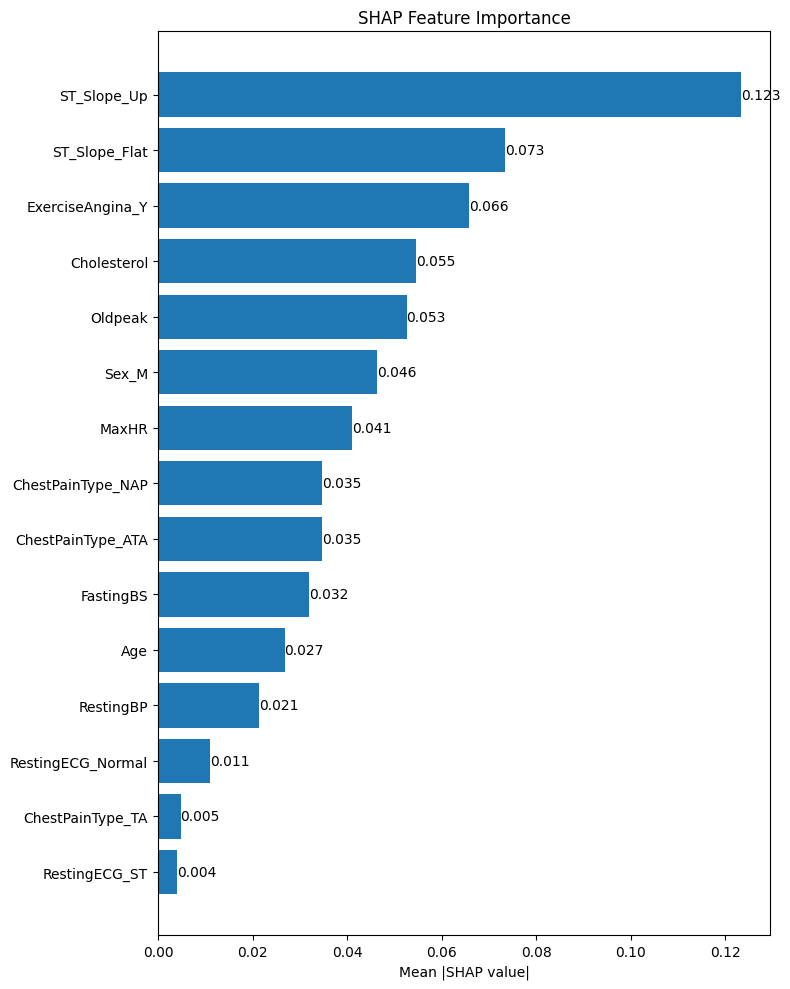

In [ ]:
# SHAP GRAFİĞİ 2

import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from imblearn.pipeline import make_pipeline as make_imb_pipeline

model = RandomForestClassifier(random_state=42)

pipeline = make_imb_pipeline(
    StandardScaler(),
    model
)

pipeline.fit(x, y)

scaler = pipeline.named_steps['standardscaler']
x_scaled = scaler.transform(x)
x_scaled_df = pd.DataFrame(x_scaled, columns=x.columns)

model = pipeline.named_steps['randomforestclassifier']

explainer = shap.Explainer(model.predict, x_scaled_df)
shap_values = explainer(x_scaled_df)

mean_shap = np.abs(shap_values.values).mean(axis=0)

importance_df = pd.DataFrame({
    "Feature": x_scaled_df.columns,
    "Importance": mean_shap
}).sort_values(by="Importance", ascending=True)

plt.figure(figsize=(8, 10))
bars = plt.barh(
    importance_df["Feature"],
    importance_df["Importance"]
)

plt.xlabel("Mean |SHAP value|")
plt.title("SHAP Feature Importance")

for bar in bars:
    width = bar.get_width()
    plt.text(
        width,
        bar.get_y() + bar.get_height() / 2,
        f"{width:.3f}",
        va="center"
    )

plt.tight_layout()
plt.show()

Optimum özellik sayısı: 14
Seçilen en iyi özellikler: ['Age', 'RestingBP', 'Cholesterol', 'FastingBS', 'MaxHR', 'Oldpeak', 'Sex_M', 'ChestPainType_ATA', 'ChestPainType_NAP', 'RestingECG_Normal', 'RestingECG_ST', 'ExerciseAngina_Y', 'ST_Slope_Flat', 'ST_Slope_Up']


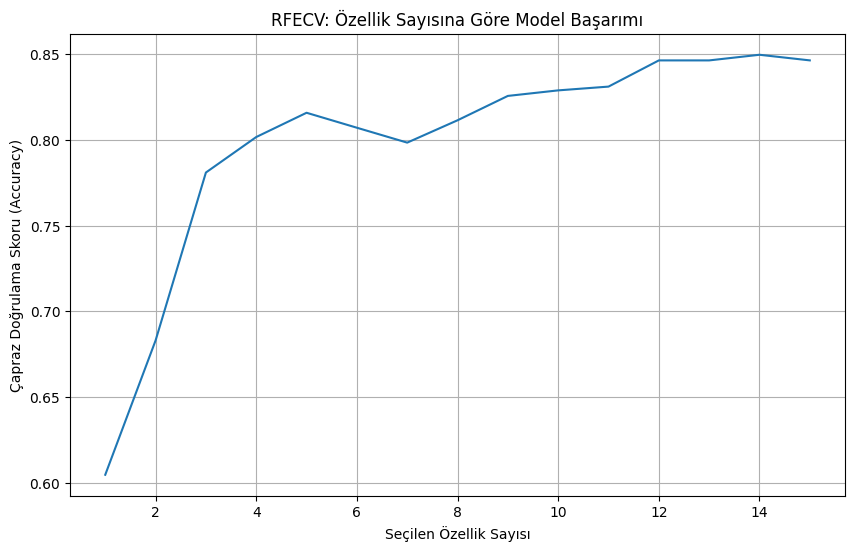

In [ ]:
from sklearn.feature_selection import RFECV

# 1. Model ve Çapraz Doğrulama Yapısını Belirleyelim
rf = RandomForestClassifier(random_state=42)
cv = StratifiedKFold(n_splits=10)

# 2. RFECV Nesnesini Oluşturalım
selector = RFECV(estimator=rf, step=1, cv=cv, scoring='accuracy')
selector = selector.fit(x, y) 

scores = selector.cv_results_['mean_test_score']

# 3. Sonuçları Yazdıralım
print(f"Optimum özellik sayısı: {selector.n_features_}")
print(f"Seçilen en iyi özellikler: {x.columns[selector.support_].tolist()}")

# 4. RFECV Grafiğini Çizdirelim
plt.figure(figsize=(10, 6))
plt.title('RFECV: Özellik Sayısına Göre Model Başarımı')
plt.xlabel('Seçilen Özellik Sayısı')
plt.ylabel('Çapraz Doğrulama Skoru (Accuracy)')
plt.plot(range(1, len(scores) + 1), scores)
plt.grid(True)
plt.show()

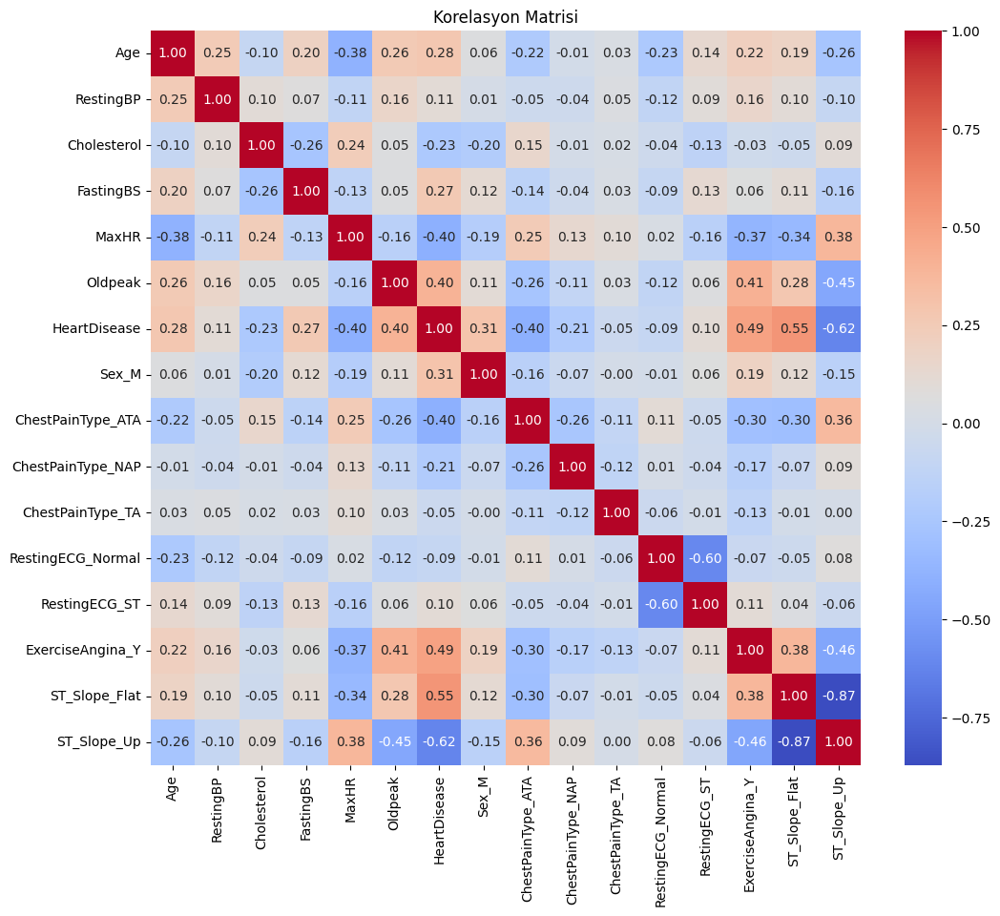

In [25]:
plt.figure(figsize=(12,10))
sns.heatmap(df_final.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Korelasyon Matrisi")
plt.show()